In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as sts
from scipy.special import chdtri
import geopandas as geopd
import shapefile as shp
import geoviews as gv

In [2]:
data = np.genfromtxt('lab1.csv',delimiter=',')

In [3]:
a0 = np.mean(data)
variance0 = np.var(data)
std0 = np.std(data)
print(a0)
print(variance0)
print(std0)

60.04635761589404
36.04420858734266
6.003682918621091


### H0 M(X) = 60. H1 M(X) != 60

In [4]:
n = len(data)
a0 = 60
mean = np.mean(data)
S = n / (n - 1) * std0
T = (mean - a0) * np.sqrt(n) / S
print(T)

0.13374155540125507


In [5]:
alpha = 0.05
T_right_critical = sts.t.ppf(1- (alpha / 2), n - 1)
T_left_critical = -T_right_critical
print(T_right_critical)
print(T_left_critical)
print(T)
if T < T_right_critical and T > T_left_critical:
    print('Немає підстав відхилити гіпотезу Н0')
else:
    print('Відхиляємо гіпотезу Н0')

1.9678765312853974
-1.9678765312853974
0.13374155540125507
Немає підстав відхилити гіпотезу Н0


In [6]:
v0 = 36
variance = (n / (n-1)) * np.var(data)
chi_2 = (n - 1) * variance / v0
print(chi_2)
chi_2_rigth_critical = chdtri(n-1,alpha)
print(chi_2_rigth_critical)
chi_2_left_critical = -chi_2_rigth_critical
if chi_2 < chi_2_rigth_critical and chi_2 > chi_2_left_critical:
    print('Немає підстав відхилити гіпотезу Н0')
else:
    print('Відхиляємо гіпотезу Н0')


302.37086092715225
342.4622616746079
Немає підстав відхилити гіпотезу Н0


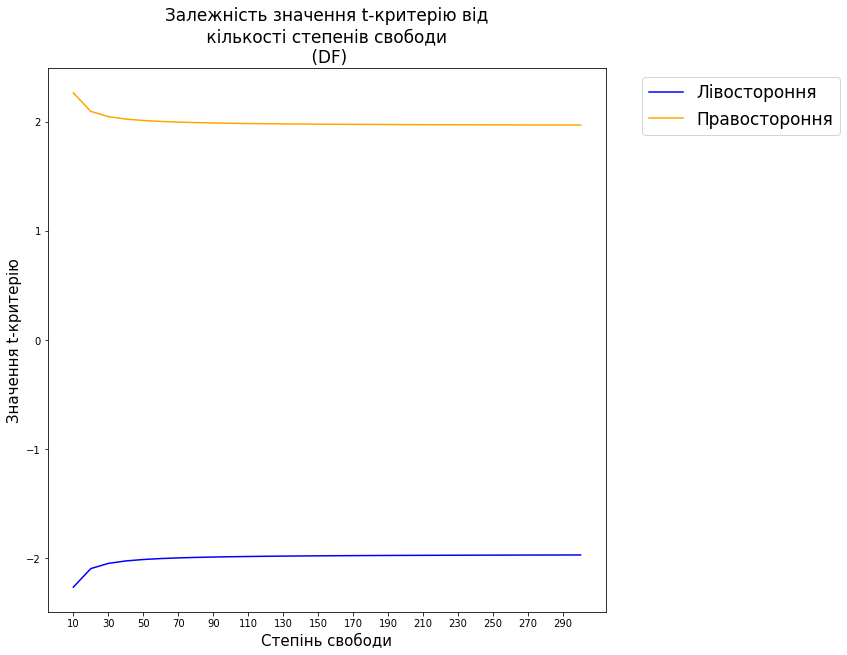

In [7]:
degrees_of_freedom = range(10,n,10)
T_right_criticals = []
T_left_criticals = []
for df in degrees_of_freedom:
    T_right_criticals.append(sts.t.ppf(1-(alpha / 2 ), df - 1))
    T_left_criticals.append(-(sts.t.ppf(1-(alpha / 2 ), df - 1)))
fig, axes = plt.subplots(1, 1, figsize=(10,10))
right, = axes.plot(degrees_of_freedom,T_right_criticals,color='orange')
left, = axes.plot(degrees_of_freedom,T_left_criticals,color='blue')
# T_val, = axes.plot(degrees_of_freedom,[T]*len(degrees_of_freedom), color='black')
axes.set_xticks(degrees_of_freedom[::2])
axes.set_xlabel('Степінь свободи', fontsize=15)
axes.set_ylabel('Значення t-критерію', fontsize=15)
axes.set_title('Залежність значення t-критерію від\n кількості степенів свободи \n (DF)', fontsize=17)
plt.legend([left,right],
           ['Лівостороння','Правостороння'],
           fontsize=17,
           loc='best',
           bbox_to_anchor=(1.05,1))
plt.show()

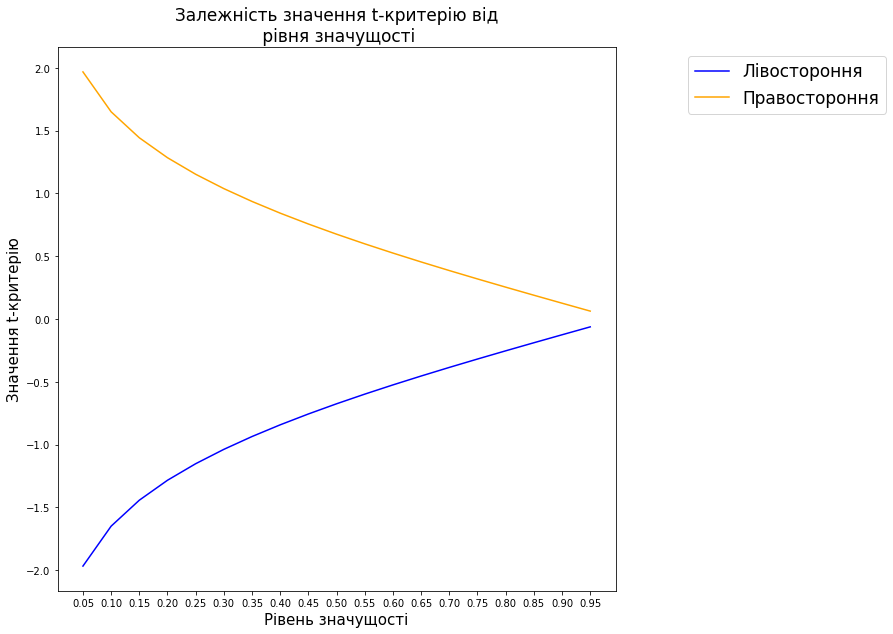

In [8]:
alphas = np.arange(0.05,1,0.05)
T_right_criticals = []
T_left_criticals = []
for alpha in alphas:
    T_right_criticals.append(sts.t.ppf(1-(alpha / 2 ), n - 1))
    T_left_criticals.append(-(sts.t.ppf(1-(alpha / 2 ), n - 1)))
fig, axes = plt.subplots(1, 1, figsize=(10,10))
right, = axes.plot(alphas,T_right_criticals,color='orange')
left, = axes.plot(alphas,T_left_criticals,color='blue')
axes.set_xticks(alphas)
axes.set_xlabel('Рівень значущості', fontsize=15)
axes.set_ylabel('Значення t-критерію', fontsize=15)
axes.set_title('Залежність значення t-критерію від\n рівня значущості', fontsize=17)
plt.legend([left,right],
           ['Лівостороння','Правостороння'],
           fontsize=17,
           loc='best',
           bbox_to_anchor=(1.5,1))
plt.show()

In [9]:
import matplotlib.image as mpimg

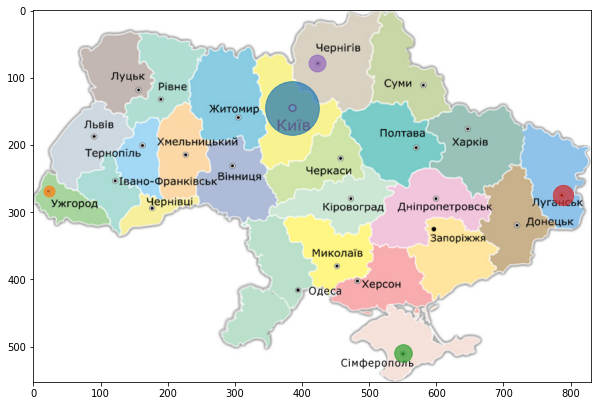

Найбільша відстань між містами:Ужгород - Луганськ 
Відстань в кілометрах = 1247.0km 
Відстань в пікселях = 765.0px


In [10]:
km_per_pix = 1.63
cities_names = ['Київ','Ужгород','Сімферополь','Луганськ','Чернівці']
cities_coord = [(385,144),(23,268),(550,510),(788,275),(423,78)]
cities_population = [2.88,0.12,0.312,0.409,0.285]
img = mpimg.imread('Ukraine.jpg')
figure = plt.figure(figsize=(10,10))
axes = figure.add_subplot()
axes.imshow(img)
for i in range(len(cities_coord)):
    axes.scatter(cities_coord[i][0],cities_coord[i][1],s=cities_population[i]*10**3,alpha=0.7)
plt.show()
distances = np.zeros((len(cities_coord),len(cities_coord)))
for i in range(len(cities_coord)):
    for j in range(len(cities_coord)):
        distances[i,j] = np.sqrt(np.square(cities_coord[i][0] - cities_coord[j][0]) + 
                                 np.square(cities_coord[i][1] - cities_coord[j][1]))
ind = np.unravel_index(np.argmax(distances, axis=None), distances.shape)

print(f'Найбільша відстань між містами:{cities_names[ind[0]]} - {cities_names[ind[1]]} \n'+
f'Відстань в кілометрах = {np.round(km_per_pix * distances[ind],0)}km \n' +
f'Відстань в пікселях = {np.round(distances[ind],0)}px')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
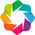

In [11]:
gv.extension('bokeh')

In [14]:
from geoviews import dim
conflicts = pd.read_csv('conflicts.csv', delimiter=';', decimal=',')

grouped_conflicts = conflicts.groupby(['country', 'longitude', 'latitude']).size().to_frame('quantity')
points = gv.Points(grouped_conflicts, ['longitude', 'latitude'])
carto_map = gv.tile_sources.EsriImagery
carto_map * points.opts( 
    color='quantity', size=dim('quantity') ** (1/2) * 6,
    cmap='Blues', tools=['hover'], width=1000, height=1000, 
    alpha=0.5, colorbar=True
)

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [longitude,latitude]   (quantity)

In [13]:
conflicts_ukr = conflicts[conflicts['country'] == "Ukraine"]

grouped_conflicts_ukr = conflicts_ukr.groupby(['country', 'longitude', 'latitude']).size().to_frame('quantity')
points = gv.Points(grouped_conflicts_ukr, ['longitude', 'latitude'])
carto_map = gv.tile_sources.ESRI
carto_map * points.opts( 
    color='quantity', size=dim('quantity') ** (1/2) * 10,
    cmap='Greens', tools=['hover'], width=1000, height=1000, 
    alpha=0.5, colorbar=True
)

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [longitude,latitude]   (quantity)

In [16]:
grouped_conflicts_ukr = conflicts_ukr.groupby(['country', 'year',]).size().to_frame('count')
grouped_conflicts_ukr

count
country year       
Ukraine 2014    269
        2015    252
        2016    123

In [86]:
gdf = geopd.read_file('UKR_ADM1.shp')
gv.Polygons(gdf).options(width=1000, height=800)


:Polygons   [Longitude,Latitude]   (ISO_Code,Level,Name,adm,adm_int,feature_id,gbid,iso)

In [14]:
dpp = pd.read_csv('ukr_DPP.csv', encoding='ANSI', delimiter=';',decimal=',')
gdp = pd.read_csv('ukr_GDP.csv', encoding='ANSI', delimiter=';',decimal=',')

dpp_areas = geopd.GeoDataFrame(pd.merge(dpp[['Name','2016']],gdf))
gdp_areas = geopd.GeoDataFrame(pd.merge(gdp[['Name','2016']],gdf))

gv.Polygons(dpp_areas, vdims=['Name','2016']).options(
    tools=['hover'], width=1000, height=700, color='2016',
    colorbar=True, toolbar='above')

:Polygons   [Longitude,Latitude]   (Name,2016)

In [15]:
gv.Polygons(gdp_areas, vdims=['Name','2016']).options(
    tools=['hover'], width=1000, height=700, color='2016',
    colorbar=True, toolbar='above', xaxis=None, yaxis=None)

:Polygons   [Longitude,Latitude]   (Name,2016)

### Кореляція

In [16]:
dpp

,Name,UKRname,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Autonomous Republic of Crimea,Автономна Республіка Крим,6567.0,8589.7,11515.8,12036.3,15480.0,18231.0,20751.0,22793.2,NaN,NaN,NaN
1,Vinnytsia Oblast,Вінницька,6980.5,8963.3,11676.4,12191.7,16018.0,19090.8,21734.9,23000.6,23421.7,29637.1,34931.4
2,Volyn Oblast,Волинська,6387.6,8022.6,10597.3,10966.8,14311.9,16657.7,18806.9,19804.9,20137.2,24979.9,30012.5
3,Dnipropetrovsk Oblast,Дніпропетровська,8632.3,11439.0,15459.9,16386.5,20739.4,24302.4,28771.6,30300.6,32036.2,39142.0,44365.9
4,Donetsk Oblast,Донецька,8855.9,11625.7,16220.1,17014.0,21317.3,24890.3,29336.6,31048.5,26234.4,21346.4,20927.0
5,Zhytomyr Oblast,Житомирська,6754.3,8864.5,12022.6,12179.8,15775.9,18716.4,21288.0,21652.1,22102.1,27801.4,32979.1
6,Zakarpattia Oblast,Закарпатська,5757.7,7323.8,9664.5,9764.5,12699.6,15002.4,17191.4,17929.3,17358.1,22456.7,26856.2
7,Zaporizhia Oblast,Запорізька,8693.6,11276.2,15265.2,15652.6,20221.4,23684.9,27107.6,28388.1,30181.8,36277.4,43461.6
8,Ivano-Frankivsk Oblast,Івано-Франківська,6463.4,8336.0,11262.8,11692.4,15009.4,17732.6,20148.4,20987.8,20356.7,26540.1,31718.9
9,Kyiv Oblast,Київська,7953.8,10248.8,14292.4,15024.9,19513.9,22520.1,26541.7,27390.6,28443.3,33955.6,40126.9


In [62]:
areas_names = dpp['Name']
corr_coefs = {'Name':[],'Corr':[]} 

dpp_ = dpp.loc[:, ~dpp.columns.isin(['Name','UKRname','2016'])]
gdp_ = gdp.loc[:, ~dpp.columns.isin(['Name','UKRname','2016'])]

dpp_ = dpp_.T.fillna(dpp_.mean(axis=1)).T
gdp_ = gdp_.T.fillna(gdp_.mean(axis=1)).T
for i in range(len(areas_names)):
    
    dpp_area = dpp_.loc[i]
    gdp_area = gdp_.loc[i]
    corr_coefs['Corr'].append(np.corrcoef(dpp_area,gdp_area)[0,1])
    corr_coefs['Name'].append(dpp.loc[i,'Name'])
corr_areas = pd.DataFrame(data=corr_coefs)

cdf = geopd.GeoDataFrame(pd.merge(corr_areas,gdf))

,Name,Corr,ISO_Code,Level,adm,adm_int,feature_id,gbid,iso,geometry
0,Autonomous Republic of Crimea,0.094085,UA-43,ADM1,ADM1,1,18,UKR_ADM1_1_3_3_18,UKR,"POLYGON ((36.68157 45.45661, 36.66350 45.35994..."
1,Vinnytsia Oblast,0.271236,UA-05,ADM1,ADM1,1,19,UKR_ADM1_1_3_3_19,UKR,"POLYGON ((30.02077 48.51923, 30.01725 48.51777..."
2,Volyn Oblast,0.257999,UA-07,ADM1,ADM1,1,1,UKR_ADM1_1_3_3_1,UKR,"POLYGON ((26.10729 51.00529, 26.08816 51.00426..."
3,Dnipropetrovsk Oblast,0.264664,UA-12,ADM1,ADM1,1,23,UKR_ADM1_1_3_3_23,UKR,"POLYGON ((36.93604 48.19851, 36.93689 48.19419..."
4,Donetsk Oblast,0.294868,UA-14,ADM1,ADM1,1,9,UKR_ADM1_1_3_3_9,UKR,"POLYGON ((39.09144 47.94099, 39.09062 47.93890..."
5,Zhytomyr Oblast,0.256155,UA-18,ADM1,ADM1,1,3,UKR_ADM1_1_3_3_3,UKR,"POLYGON ((29.73521 49.94438, 29.72536 49.94179..."
6,Zakarpattia Oblast,0.245984,UA-21,ADM1,ADM1,1,13,UKR_ADM1_1_3_3_13,UKR,"POLYGON ((24.62644 48.04918, 24.62640 48.04859..."
7,Zaporizhia Oblast,0.259108,UA-23,ADM1,ADM1,1,10,UKR_ADM1_1_3_3_10,UKR,"POLYGON ((37.24863 47.45723, 37.24842 47.45682..."
8,Ivano-Frankivsk Oblast,0.251567,UA-26,ADM1,ADM1,1,12,UKR_ADM1_1_3_3_12,UKR,"POLYGON ((25.65312 48.70443, 25.65309 48.70316..."
9,Kyiv Oblast,0.221959,UA-32,ADM1,ADM1,1,4,UKR_ADM1_1_3_3_4,UKR,"MULTIPOLYGON (((30.34907 50.48887, 30.34805 50..."


In [65]:
gv.Polygons(cdf, vdims=['Name','Corr']).options(
    tools=['hover'], width=1000, height=700, color='Corr',
    colorbar=True, toolbar='above', xaxis=None, yaxis=None)

:Polygons   [Longitude,Latitude]   (Name,Corr)